In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import openpyxl
import re
import os
import itertools
from tqdm.auto import tqdm
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
import plotly.io as pio
from typing import Any, Dict, List, Union

In [2]:
publishers = ["HarperCollins", "Little, Brown and Company", "Tor Books", "Doubleday", "Bloomsbury Publishing"]  # Disney Hyperion Books (Disney Publishing Group)、Oxford World's Classics 沒有書在榜
formats = ["Paperback", "Hardcover", "Kindle"]
features = ["category_rank", "whole_rank", "original_price", "publish_year"]

In [17]:
data_3dep_ori = pd.read_csv("data_0515/3dep_0_41398.csv", encoding="latin-1")

In [18]:
def formatting_data(data: pd.DataFrame) -> pd.DataFrame:
    data = data.rename(columns={"all_rank_list": "whole_rank", "before_discount": "original_price", "new_price": "selling_price", "department": "category"})

    def clean_price_column(price_series: pd.Series) -> pd.Series:
        price_series_cleaned = price_series.astype(str).str.extract(r"(\$?[0-9]+(?:\.[0-9]{1,2})?)", expand=False)
        price_series_cleaned = price_series_cleaned.str.replace("$", "", regex=False).astype(float)
        price_series_cleaned = price_series_cleaned.where((price_series_cleaned >= 0) & (price_series_cleaned < 200), np.nan)
        return price_series_cleaned

    data["whole_rank"] = data["whole_rank"].apply(lambda x: int("".join(filter(str.isdigit, str(x)))) if "#" in str(x) else None).astype(float)
    data["whole_rank"] = data["whole_rank"].where(data["whole_rank"] > 0, np.nan)
    data["format"] = data["format"].apply(lambda x: next((f for f in formats if f in str(x)), "Other Format")).astype(str)
    data["original_price"] = clean_price_column(data["original_price"])
    data["selling_price"] = clean_price_column(data["selling_price"])
    data["original_price"] = data["original_price"].fillna(data["selling_price"])
    data["publisher"] = data["other_list"].apply(lambda x: next((p for p in publishers if f"Publisher:{p}".lower() in str(x).lower()), "Other Publishers")).astype(str)
    data["publish_year"] = data["other_list"].str.extract(r"\b(\d{4})\b", expand=False).astype(float).astype("Int64")
    data["publish_year"] = data["publish_year"].where((data["publish_year"] >= 1600) & (data["publish_year"] <= 2025), np.nan)
    data["discount_rate"] = data["selling_price"] / data["original_price"]
    data["discount_rate"] = data["discount_rate"].where((data["discount_rate"] >= 0) & (data["discount_rate"] <= 1), np.nan).astype(float)

    return data.drop_duplicates()


data_2dep = formatting_data(data_3dep_ori)
data_2dep.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99239 entries, 0 to 193268
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   whole_rank      95657 non-null  float64
 1   format          99239 non-null  object 
 2   original_price  98419 non-null  float64
 3   selling_price   98411 non-null  float64
 4   title           99237 non-null  object 
 5   scrape_time     99221 non-null  object 
 6   other_list      99221 non-null  object 
 7   category        99221 non-null  object 
 8   author          75956 non-null  object 
 9   publisher       99239 non-null  object 
 10  publish_year    86084 non-null  Int64  
 11  discount_rate   84123 non-null  float64
dtypes: Int64(1), float64(4), object(7)
memory usage: 9.9+ MB


In [7]:
categories = set(data_3dep["category"])
len(categories)

540

In [19]:
def consolidate_books(data: pd.DataFrame) -> pd.DataFrame:
    # 初始化一個空列表，用來存放處理後的書籍數據，每個元素是一個字典，對應一本書的整合數據。
    consolidated_list: List[Dict[str, Any]] = []

    # 對原始數據按照書名(title)進行分組，每一組代表同一本書的不同條目。
    for title, group in data.groupby("title"):
        # 創建一個字典來存放當前書的整合數據。
        # key為書名，value為書名本身。
        # category欄位結合同一書名下所有不同類別，使用分號隔開。
        book_data: Dict[str, Union[str, float]] = {"title": title, "category": ";".join(group["category"].astype(str).unique())}

        # 再次對同一書名的數據按照版本(format)進行分組。
        for format_group in group.groupby("format"):
            # 格式化版本名稱，將空格替換為下劃線並轉為小寫，以便後續作為欄位名使用。
            format_type: str = format_group[0].replace(" ", "_").lower()
            # 獲取具體某一版本的所有條目。
            format_data: pd.DataFrame = format_group[1]
            # 從這些條目中選擇第一條作為代表。
            representative: pd.Series = format_data.iloc[0]

            # 遍歷需要整合的欄位名稱列表。
            for field in ["original_price", "selling_price", "other_list", "author", "publisher", "publish_year", "discount_rate", "whole_rank"]:
                # 為每個欄位名稱加上版本前綴，並從代表條目中提取對應的值，存放到book_data字典中。
                book_data[f"{format_type}-{field}"] = representative[field]

        # 將處理後的書籍數據加入到列表中。
        consolidated_list.append(book_data)

    # 將列表轉換為DataFrame並返回。
    return pd.DataFrame(consolidated_list)


data_2dep_con = consolidate_books(data_2dep)

In [20]:
data_2dep_biz = data_2dep_con[data_2dep_con["category"].str.contains("Business & Money")]
data_2dep_fic = data_2dep_con[data_2dep_con["category"].str.contains("Literature & Fiction")]

In [10]:
data_2dep_biz.info()

<class 'pandas.core.series.Series'>
RangeIndex: 33383 entries, 0 to 33382
Series name: category
Non-Null Count  Dtype
--------------  -----
33383 non-null  bool 
dtypes: bool(1)
memory usage: 32.7 KB


C:\Users\USER\AppData\Local\Temp\ipykernel_13108\1928765821.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\USER\AppData\Local\Temp\ipykernel_13108\1928765821.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\USER\AppData\Local\Temp\ipykernel_13108\1928765821.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

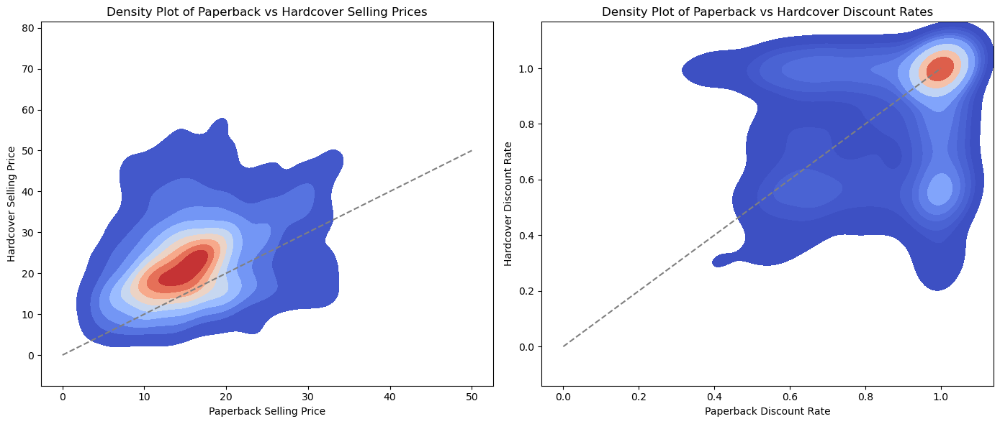

In [22]:
def plot_density(data: pd.DataFrame) -> pd.DataFrame:
    # Ensure the data types are correct for plotting
    data["paperback-selling_price"] = pd.to_numeric(data["paperback-selling_price"], errors="coerce")
    data["hardcover-selling_price"] = pd.to_numeric(data["hardcover-selling_price"], errors="coerce")
    data["paperback-discount_rate"] = pd.to_numeric(data["paperback-discount_rate"], errors="coerce")
    data["hardcover-discount_rate"] = pd.to_numeric(data["hardcover-discount_rate"], errors="coerce")

    # Remove outliers
    data = data[
        (data["paperback-selling_price"].between(0, data["paperback-selling_price"].quantile(0.9)))
        & (data["hardcover-selling_price"].between(0, data["hardcover-selling_price"].quantile(0.9)))
        & (data["paperback-discount_rate"].between(0, data["paperback-discount_rate"].quantile(0.9)))
        & (data["hardcover-discount_rate"].between(0, data["hardcover-discount_rate"].quantile(0.9)))
    ]

    # Plot the density plot for selling prices
    plt.figure(figsize=(14, 6))

    # Set seaborn palette
    sns.set_palette("coolwarm")

    plt.subplot(1, 2, 1)
    sns.kdeplot(data=data, x="paperback-selling_price", y="hardcover-selling_price", fill=True, cmap="coolwarm")
    plt.title("Density Plot of Paperback vs Hardcover Selling Prices")
    plt.xlabel("Paperback Selling Price")
    plt.ylabel("Hardcover Selling Price")
    plt.plot([0, 50], [0, 50], linestyle="--", color="gray")

    # Plot the density plot for discount rates
    plt.subplot(1, 2, 2)
    sns.kdeplot(data=data, x="paperback-discount_rate", y="hardcover-discount_rate", fill=True, cmap="coolwarm")
    plt.title("Density Plot of Paperback vs Hardcover Discount Rates")
    plt.xlabel("Paperback Discount Rate")
    plt.ylabel("Hardcover Discount Rate")
    plt.plot([0, data["paperback-discount_rate"].max()], [0, data["hardcover-discount_rate"].max()], linestyle="--", color="gray")

    plt.tight_layout()
    plt.savefig("0524_figs/2dep_biz/density.svg")
    plt.show()


# Call the function to plot
plot_density(data_2dep_biz)

In [23]:
data_2dep_fic["hard_over_paper"] = data_2dep_fic["hardcover-selling_price"] / data_2dep_fic["paperback-selling_price"]
data_2dep_biz["hard_over_paper"] = data_2dep_biz["hardcover-selling_price"] / data_2dep_biz["paperback-selling_price"]

C:\Users\USER\AppData\Local\Temp\ipykernel_13108\2904586022.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\USER\AppData\Local\Temp\ipykernel_13108\2904586022.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [40]:
data_3dep_con[data_3dep_con["hard_over_paper"] == 1]["hard_over_paper"].describe()

count    56.0
mean      1.0
std       0.0
min       1.0
25%       1.0
50%       1.0
75%       1.0
max       1.0
Name: hard_over_paper, dtype: float64

In [28]:
def plot_feature_distributions(data: pd.DataFrame) -> None:
    # Define bins for each variable
    bins_ranges = {
        "whole_rank": [1, 100, 1000, 10000, 100000, 1000000, 10000000, 100000000],
        "original_price": [0, 5, 10, 15, 20, 25, 30, 100],
        "selling_price": [0, 5, 10, 20, 30, 40, 100],
        "publish_year": [0, 1990, 1995, 2000, 2005, 2010, 2015, 2020, 2025],
    }

    # Define hard_over_paper categories
    def categorize_hop(hop):
        if hop < 1:
            return "<1"
        elif hop == 1:
            return "=1"
        elif 1 < hop <= 1.5:
            return "(1, 1.5]"
        elif 1.5 < hop <= 2:
            return "(1.5, 2]"
        else:
            return ">2"

    # Add category column to data
    data["hop_category"] = data["hard_over_paper"].apply(categorize_hop)

    cluster_data = data.copy()

    # Define plot variables and book types
    variables = ["whole_rank", "original_price", "selling_price", "publish_year"]
    book_types = ["paperback", "hardcover"]

    # Define the order of categories
    hop_categories_order = ["<1", "=1", "(1, 1.5]", "(1.5, 2]", ">2"]

    for var in variables:
        fig = sp.make_subplots(
            rows=len(book_types),
            cols=len(hop_categories_order),
            subplot_titles=[f"{book_type.capitalize()} - {category}" for book_type in book_types for category in hop_categories_order],
        )

        for i, book_type in enumerate(book_types):
            for j, category in enumerate(hop_categories_order):
                row = i + 1
                col = j + 1
                var_name = f"{book_type}-{var}"
                category_subset = cluster_data[cluster_data["hop_category"] == category]

                # Drop NA values in the subset
                category_subset = category_subset.dropna(subset=[var_name])

                if var != "discount_rate":
                    bins = bins_ranges[var]
                    counts, bins = pd.cut(category_subset[var_name], bins=bins, retbins=True)
                    counts = counts.value_counts(sort=False)
                    fig.add_trace(go.Bar(x=[f"{int(bins[k])}-{int(bins[k+1])}" for k in range(len(bins) - 1)], y=counts, name=var_name), row=row, col=col)
                else:
                    var_name = f"{book_type}-discount_rate"
                    fig.add_trace(go.Histogram(x=category_subset[var_name], name=var_name), row=row, col=col)

        fig.update_layout(height=800, width=1200, title_text=f"{var.capitalize()} Distributions")
        fig.write_image(f"0524_figs/2dep_fic/{var}_distributions.svg")
        fig.show()


plot_feature_distributions(data_2dep_fic)

C:\Users\USER\AppData\Local\Temp\ipykernel_13108\2921115777.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [41]:
data_3dep_con["paperback-whole_rank"].describe()

count    3.009400e+04
mean     9.062540e+05
std      1.371929e+06
min      8.000000e+00
25%      7.531250e+04
50%      3.778265e+05
75%      1.197096e+06
max      1.241722e+07
Name: paperback-whole_rank, dtype: float64

In [27]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


def plot_violin_distributions(data: pd.DataFrame) -> None:
    # Define hard_over_paper categories
    def categorize_hop(hop):
        if hop <= 1:
            return "<=1"
        elif 1 < hop <= 2:
            return "(1, 2]"
        else:
            return ">2"

    # Add category column to data
    data["hop_category"] = data["hard_over_paper"].apply(categorize_hop)

    # Define the order of categories
    hop_categories_order = ["<=1", "(1, 2]", ">2"]
    data["hop_category"] = pd.Categorical(data["hop_category"], categories=hop_categories_order, ordered=True)

    # Define plot variables and book types
    variables = ["whole_rank", "original_price", "selling_price", "publish_year", "discount_rate"]
    book_types = ["paperback", "hardcover"]

    for var in variables:
        fig = make_subplots(rows=1, cols=2, subplot_titles=("Paperback", "Hardcover"))

        for i, book_type in enumerate(book_types):
            var_name = f"{book_type}-{var}"
            if var != "publish_year":
                threshold = data[var_name].quantile(0.9)
                filtered_data = data[data[var_name] <= threshold]
            else:
                threshold = data[var_name].quantile(0.1)
                filtered_data = data[data[var_name] >= threshold]

            violin = go.Violin(
                x=filtered_data["hop_category"],
                y=filtered_data[var_name],
                box_visible=True,
                points=False,
                meanline_visible=True,
                showlegend=False,
                name=var_name,
            )

            fig.add_trace(violin, row=1, col=i + 1)

        fig.update_xaxes(title_text="Hardcover over Paperback", categoryorder="array", categoryarray=hop_categories_order, row=1, col=1)
        fig.update_xaxes(title_text="Hardcover over Paperback", categoryorder="array", categoryarray=hop_categories_order, row=1, col=2)
        fig.update_yaxes(title_text=var, row=1, col=1)
        fig.update_yaxes(title_text=var, row=1, col=2)

        fig.update_layout(title_text=f"{var} Distributions", height=800, width=1600)
        fig.write_image(f"0524_figs/2dep_fic/{var} violin.svg")
        fig.show()


# Assuming data_3dep_con is your DataFrame
plot_violin_distributions(data_2dep_fic)

C:\Users\USER\AppData\Local\Temp\ipykernel_13108\3170091623.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\USER\AppData\Local\Temp\ipykernel_13108\3170091623.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [46]:
import pandas as pd
import plotly.express as px


def plot_violin_distributions(data: pd.DataFrame) -> None:
    # Define hard_over_paper categories
    def categorize_hop(hop):
        if hop < 1:
            return "<1"
        elif hop == 1:
            return "=1"
        elif 1 < hop <= 1.5:
            return "(1, 1.5]"
        elif 1.5 < hop <= 2:
            return "(1.5, 2]"
        else:
            return ">2"

    # Add category column to data
    data["hop_category"] = data["hard_over_paper"].apply(categorize_hop)

    # Define the order of categories
    hop_categories_order = ["<1", "=1", "(1, 1.5]", "(1.5, 2]", ">2"]
    data["hop_category"] = pd.Categorical(data["hop_category"], categories=hop_categories_order, ordered=True)

    # Define plot variables and book types
    variables = ["whole_rank", "original_price", "selling_price", "publish_year", "discount_rate"]
    book_types = ["paperback", "hardcover"]

    for var in variables:
        for book_type in book_types:
            var_name = f"{book_type}-{var}"
            if var != "publish_year":
                threshold = data[var_name].quantile(0.9)
                filtered_data = data[data[var_name] <= threshold]
            else:
                threshold = data[var_name].quantile(0.1)
                filtered_data = data[data[var_name] >= threshold]
            fig = px.violin(
                filtered_data,
                x="hop_category",
                y=var_name,
                box=True,
                points=False,
                category_orders={"hop_category": hop_categories_order},
                title=f"{var_name} Distributions by HOP Category",
                log_y=True if var == "" else False,  # Set y-axis to log scale for whole_rank
                labels={"hop_category": "Hardcover over Paperback"},
            )
            fig.update_layout(height=800)
            fig.show()


plot_violin_distributions(data_3dep_con)

In [30]:
import pandas as pd
import plotly.express as px


def plot_violin_distributions(data: pd.DataFrame) -> None:
    # Define hard_over_paper categories
    def categorize_hop(hop):
        if hop < 1:
            return "<1"
        elif hop == 1:
            return "=1"
        elif 1 < hop <= 1.5:
            return "(1, 1.5]"
        elif 1.5 < hop <= 2:
            return "(1.5, 2]"
        else:
            return ">2"

    # Add category column to data
    data["hop_category"] = data["hard_over_paper"].apply(categorize_hop)

    # Define the order of categories
    hop_categories_order = ["<1", "=1", "(1, 1.5]", "(1.5, 2]", ">2"]
    data["hop_category"] = pd.Categorical(data["hop_category"], categories=hop_categories_order, ordered=True)

    # Define plot variables and book types
    variables = ["whole_rank", "original_price", "selling_price", "publish_year"]
    book_types = ["paperback", "hardcover"]

    for var in variables:
        for book_type in book_types:
            var_name = f"{book_type}-{var}"
            fig = px.violin(data, x="hop_category", y=var_name, box=True, points=False, category_orders={"hop_category": hop_categories_order}, title=f"{var_name} Distributions by HOP Category")
            fig.show()


plot_violin_distributions(data_3dep_con)

In [30]:
import pandas as pd
import plotly.graph_objects as go
import plotly.subplots as sp


def plot_feature_distributions(data: pd.DataFrame) -> None:
    # Define bins for each variable
    bins_ranges = {
        "whole_rank": [1, 100, 1000, 10000, 100000, 1000000, 10000000, 100000000],
        "original_price": [0, 5, 10, 15, 20, 25, 30, 100],
        "selling_price": [0, 5, 10, 20, 30, 40, 100],
        "publish_year": [0, 1990, 1995, 2000, 2005, 2010, 2015, 2020, 2025],
    }

    cluster_data = data.copy()

    # Define plot variables and book types
    variables = ["whole_rank", "original_price", "selling_price", "publish_year"]
    book_types = ["paperback", "hardcover"]

    for var in variables:
        fig = sp.make_subplots(
            rows=len(book_types),
            cols=cluster_data["cluster"].nunique(),
            subplot_titles=[f"{book_type.capitalize()} - Cluster {cluster}" for book_type in book_types for cluster in cluster_data["cluster"].unique()],
        )

        for i, book_type in enumerate(book_types):
            for j, cluster in enumerate(cluster_data["cluster"].unique()):
                row = i + 1
                col = j + 1
                var_name = f"{book_type}-{var}"
                cluster_subset = cluster_data[cluster_data["cluster"] == cluster]

                if var != "discount_rate":
                    bins = bins_ranges[var]
                    counts, bins = pd.cut(cluster_subset[var_name], bins=bins, retbins=True)
                    counts = counts.value_counts(sort=False)
                    fig.add_trace(go.Bar(x=[f"{int(bins[k])}-{int(bins[k+1])}" for k in range(len(bins) - 1)], y=counts, name=var_name), row=row, col=col)
                else:
                    var_name = f"{book_type}-discount_rate"
                    fig.add_trace(go.Histogram(x=cluster_subset[var_name], name=var_name), row=row, col=col)

        fig.update_layout(height=800, width=1200, title_text=f"{var.capitalize()} Distributions")
        fig.show()


# Assuming `new_data_with_clusters` is your dataframe
plot_feature_distributions(new_data_with_clusters)